## Assignment A4: Sounds and Spectra

Note: Unlike the other assignments, there is just one part here: A4.  Also unlike the other assignments, there is no self-check or draft.  You will just submit your final version.

### David Courtney 3643806


In [1]:
using Distributions, DSP, FFTW, LinearAlgebra, Plots, Random, Statistics, WAV

# Code from A1b/A3a
function sinewave(t; f=1.0, d=0.0)
    return sin.(2 * pi * f * (t .- d))
end

# Code from A3b
function convolve(x; h=[1], h0=1)
    N = length(x)
    M = length(h)
    y = zeros(Float64, N)  # Initialize the output vector with zeros

    #Convolve x with h
    for n in 1:N
        # Because Julia is 1-based, we adjust the indices accordingly
        for k in 1:M
            j = n - k + h0  # Convert the offset to an index, considering h0
            # Check bounds, because we can't use negative or out-of-bounds indices
            if j > 0 && j <= N
                y[n] += x[j] * h[k]
            end
        end
    end

    return y
end

# Professor Lewicki's version of gabor
function gabor(x; f=1, sigma=1/f, phi=0, a=1)
    return a*exp(-x^2/(2sigma^2)) * cos(2pi*f*x + phi)
end

# Code from A1b
function gaboro(t; f, sigma, a=1)
    return gabor(t, f, sigma, (pi/2), a)
end

# Professor Lewicki's version of gabore
function gabore(x::AbstractArray; args...)
    g = gabor.(x; args...)
    return g ./ norm(g)
end

# 1a
function harmonic(t; f1=1, alist=1, phi_list=0)
    if typeof(alist) == Int || typeof(alist) == Float64
        alist = [alist]
    end
    if typeof(phi_list) == Int || typeof(phi_list) == Float64
        phi_list = [phi_list for _ in 1:length(alist)]
    end
    
    sum = 0.0
    for (n, a) in enumerate(alist)
        f_n = n * f1
        phi_n = phi_list[n]
        sum += a * cos(2 * pi * f_n * t + phi_n)
    end
    return sum
end

# 1a
function cosines(t; flist=1, alist=1, phi_list=0)
    if typeof(flist) == Int || typeof(flist) == Float64
        flist = [flist]
    end
    if typeof(alist) == Int || typeof(alist) == Float64
        alist = [alist]
    end
    if typeof(phi_list) == Int || typeof(phi_list) == Float64
        phi_list = [phi_list for _ in 1:length(flist)]
    end
    
    sum = 0.0
    for (i, f) in enumerate(flist)
        a = alist[i]
        phi = phi_list[i]
        sum += a * cos(2 * pi * f * t + phi)
    end
    return sum
end

# 1b
function generate_waveform(freq, harmonics, amplitude, phase, t)
    waveform = zeros(length(t))
    for harmonic in harmonics
        waveform .+= amplitude * sin.(2 * pi * freq * harmonic * t .+ phase) / length(harmonics)
    end
    return waveform
end

# 1c
function generate_and_plot_signals(fundamental, harmonics, fs, t)
    signals = []
    fft_results = []
    for alist in harmonics
        signal = sum([a * sin.(2 * π * (i + 1) * fundamental * t) for (i, a) in enumerate(alist)])
        push!(signals, signal)
        fft_result = fft(signal)
        push!(fft_results, fft_result)
    end
    return signals, fft_results
end

# 2a
function calculate_power(signal)
    return mean(signal .^ 2)
end

# 2a
function normalizeWaveform(waveform)
    rms = sqrt(mean(waveform .^ 2))
    return waveform / rms
end

# 2a
function genNoiseAndCreateWav(noiseType, duration=1, fs=44100)
    if noiseType == "gaussian"
        noise = randn(Int(fs * duration))
    elseif noiseType == "uniform"
        noise = rand(Float64, Int(fs * duration)) .* 2 .- 1
    elseif noiseType == "laplacian"
        noise = rand(Exponential(1/sqrt(2)), Int(fs * duration)) - rand(Exponential(1/sqrt(2)), Int(fs * duration))
    end

    noise = normalizeWaveform(noise)

    scaled_noise = clamp.(noise .* 32767, -32768, 32767)

    noise_int16 = Int16.(round.(scaled_noise))

    filename = "$(noiseType)_noise.wav"
    WAV.wavwrite(noise_int16, filename, Fs=fs)
    
    p = histogram(noise, bins=50, alpha=0.7, label=noiseType * " Noise Amplitude Distribution")
    xlabel!(p, "Amplitude")
    ylabel!(p, "Frequency")

    display(p)
end


# 2b
function synthesize_bandpass_noise(N, fs, center_freq, sigma)
    white_noise = randn(N)

    t = 0:1/fs:(N-1)/fs

    gabor = exp.(-((t .- mean(t)).^2) / (2 * sigma^2)) .* cos.(2 * pi * center_freq * (t .- mean(t)))

    convolved_signal = conv(white_noise, gabor)

    start_index = ceil(Int, (length(gabor) - 1) / 2)
    end_index = start_index + N - 1
    bandpass_noise = convolved_signal[start_index:end_index]
    
    return bandpass_noise
end

# 2b
function detect_pitch(signal, fs)
    r = xcorr(signal, signal; padmode=:none)
    middle_index = ceil(Int, length(r) / 2)
    r = r[middle_index:end]
    peak_index = argmax(r[2:end]) + 1
    T = peak_index / fs
    pitch = 1 / T
    return pitch
end

# 4a
function convolve(x, h)
    N = length(x)
    M = length(h)
    total_length = N + M - 1
    y = zeros(Float64, total_length)

    # Convolve x with h
    for n in 1:total_length
        for k in 1:M
            j = n - k + 1
            if j > 0 && j <= N
                y[n] += x[j] * h[k]
            end
        end
    end

    return y
end

# 4a
function autocorr(x; normalize=true)
    N = length(x)
    result = convolve(x, reverse(x))
    if normalize
        norm_factor = result[N]
        result = result ./ norm_factor
    end
    return result
end

# 4a
function crosscorr(x, y; normalize=true)
    N = length(x)
    M = length(y)
    result = convolve(x, reverse(y))
    if normalize
        norm_factor = sqrt(sum(x .^ 2) * sum(y .^ 2))
        result = result ./ norm_factor
    end
    return result
end


crosscorr (generic function with 1 method)

***
## Exercises


### 1. Spectral Structure

#### 1a. Harmonics

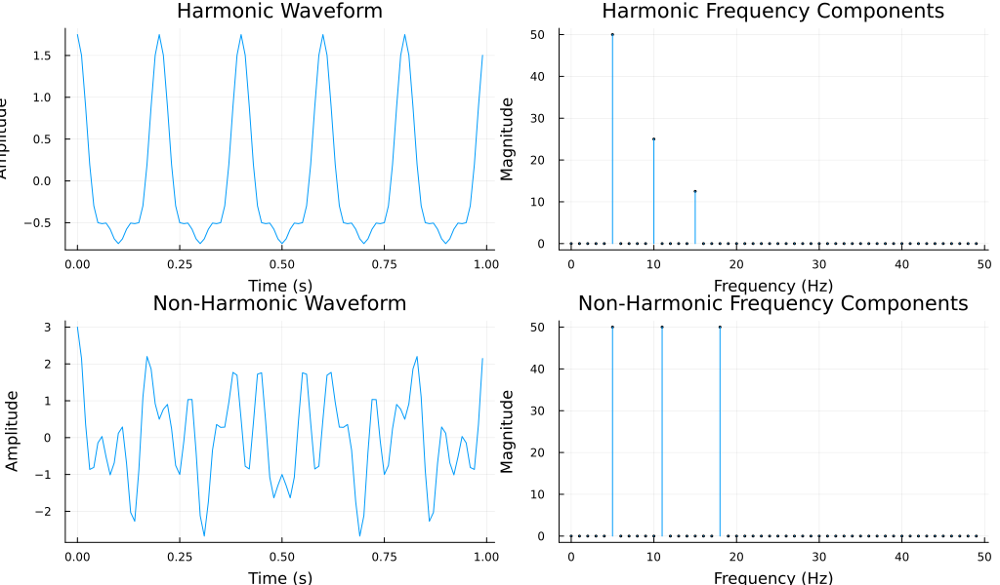

In [2]:
fs = 100       # Sampling frequency in Hz
T  = 1.0 / fs  # Sampling period in seconds
t  = 0:T:1-T   # Time vector

harmonic_signal = [harmonic(ti; f1=5, alist=[1, 0.5, 0.25], phi_list=[0, 0, 0]) for ti in t]
nonharmonic_signal = [cosines(ti; flist=[5, 11, 18], alist=[1, 1, 1], phi_list=[0, 0, 0]) for ti in t]

fft_harmonic = fft(harmonic_signal)
fft_nonharmonic = fft(nonharmonic_signal)
f = (0:length(t)/2-1) * fs / length(t)

p1 = plot(t, harmonic_signal, title="Harmonic Waveform", xlabel="Time (s)", ylabel="Amplitude", legend=false)
p2 = plot(f, abs.(fft_harmonic[1:length(f)]), title="Harmonic Frequency Components", xlabel="Frequency (Hz)", ylabel="Magnitude", seriestype=:stem, marker=:circle, markersize=1, legend=false)

p3 = plot(t, nonharmonic_signal, title="Non-Harmonic Waveform", xlabel="Time (s)", ylabel="Amplitude", legend=false)
p4 = plot(f, abs.(fft_nonharmonic[1:length(f)]), title="Non-Harmonic Frequency Components", xlabel="Frequency (Hz)", ylabel="Magnitude", seriestype=:stem, marker=:circle, markersize=1, legend=false)

final_plot = plot(p1, p2, p3, p4, layout=(2,2), size=(1024, 600))

display(final_plot)

#### 1b. Pitch and tone

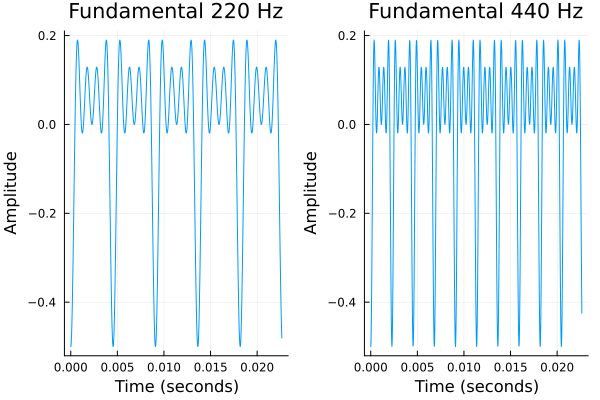

In [3]:
sampling_rate = 44100
duration = 2
t = range(0, stop=duration, length=sampling_rate * duration)
frequencies = [220, 440]
harmonics = [1, 2, 3, 4]
amplitude = 0.5
phase = -pi / 2

waveforms = [generate_waveform(freq, harmonics, amplitude, phase, t) for freq in frequencies]
for (i, waveform) in enumerate(waveforms)
    WAV.wavwrite(waveform, "sound_$(i)_$(frequencies[i])Hz.wav", Fs=sampling_rate)
end

p1 = plot(t[1:1000], waveforms[1][1:1000], title="Fundamental 220 Hz", xlabel="Time (seconds)", ylabel="Amplitude")
p2 = plot(t[1:1000], waveforms[2][1:1000], title="Fundamental 440 Hz", xlabel="Time (seconds)", ylabel="Amplitude")
plot(p1, p2, layout=(1, 2), legend=false)


### Do the sounds ?(at with)? different fundamentals sound similar?

The similarity of sounds with different fundamental frequencies, but identical harmonic structures, can be subjective and depends on several factors, including the listener's experience, the harmonic content, and the context in which the sounds are heard.

In the case of the harmonic signals we've just created:

1. **Harmonic Content**: Since both sounds have the same harmonic amplitudes and structure, they share a similar "timbre" or "color." This means that while they might be recognized as being of the same type or category of sound (for example, both might be recognized as sounds from the same musical instrument), they will not be identical due to the difference in fundamental frequency.

2. **Fundamental Frequency (Pitch)**: The fundamental frequency determines the perceived "pitch" of the sound. A sound with a fundamental frequency of 220 Hz (A3) will be perceived as being one octave lower than a sound with a fundamental frequency of 440 Hz (A4). So, while they share the same harmonic structure, they sound like the same note played in two different octaves.

3. **Perception of Octaves**: Humans generally perceive notes one octave apart as having a special kind of similarity. They're different (higher or lower), but they share a musical quality that makes them more similar to each other than notes with a more random frequency relationship. Therefore, while they sound different in pitch, there is a perceived musical relationship between them.

If you listen to the synthesized stereo audio file containing both signals, you might notice that they have a similar character or quality due to their shared harmonic content, but they will definitely differ in pitch due to their different fundamental frequencies. The lower-pitched one (at 220 Hz) will sound deeper, while the higher-pitched one (at 440 Hz) will sound brighter or more "uplifted."

In summary, while the two sounds share a timbral quality due to their harmonic structure, they will not sound identical due to their different pitches.

### How you describe the sound *tone*, i.e. how it sounds?

The tone of the generated sounds, with their harmonic structures, is smooth but not what I would call musical. The lower-pitched one sounds deeper and mellower, while the higher-pitched one sounds brighter and sharper. Both share a similar quality due to identical harmonic content, giving them a coherent and rich character.

### Observe that, in general, we perceive the sound with harmonics *holistically* i.e. as a single percept and not as a combination of the individual frequencies of the harmonics.

Observed.

#### 1c. Timbre
The pattern of harmonics, i.e. their relative amplitudes, is related to how a voice or musical note sounds, e.g. the difference between the sound of a piano vs that of a violin.  This is called **timbre** or musical tone.  Like pitch, timbre is a complex perceptual phenomenon.  Here, we just want to focus on how it relates to harmonics.

Use your code from the previous question to experiment with different harmonic patterns.  Find two set of values that have a similar sounding tone for different fundamentals, and, conversely, sound very different for the same fundamental.  

Present your results like you did above by plotting the harmonic patterns as stem plots in frequency space with associated plots showing a few periods of the waveforms.

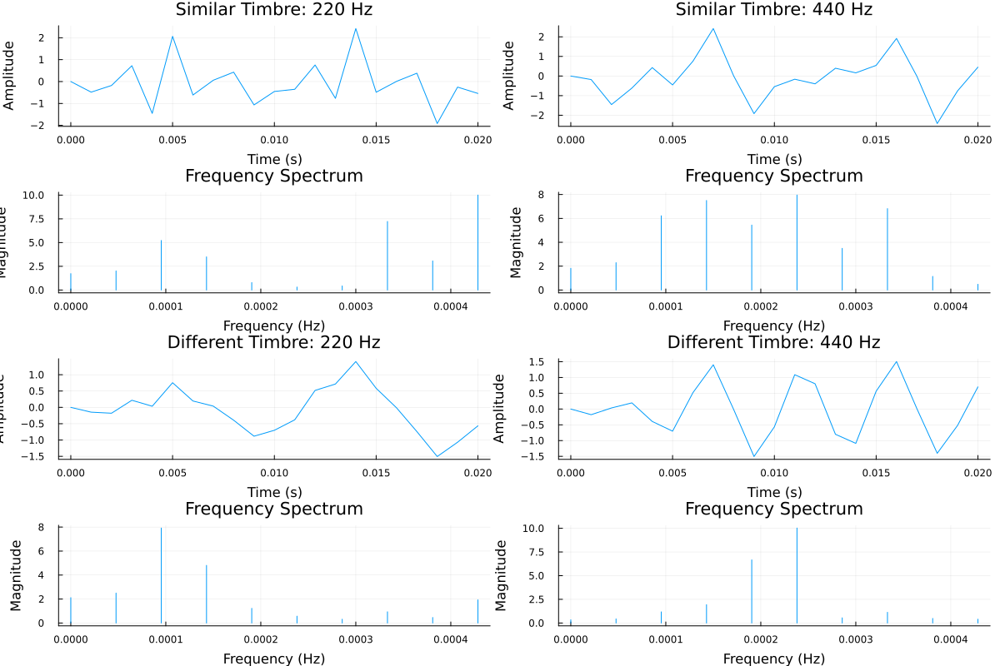

In [4]:
harmonics_similar = [[1, 0.8, 0.6, 0.4], [1, 0.8, 0.6, 0.4]]      # Similar timbre
harmonics_different = [[1, 0.8, 0.6, 0.4], [0.2, 0.1, 0.8, 0.7]]  # Different timbre
fundamentals = [220, 440]  # For example, A3 and A4
fs = 1000                  # Sampling frequency for plotting
duration = 0.02            # Short duration for a few periods
t = 0:1/fs:duration
p = plot(layout = (4, 2), size = (1200, 800))

for (i, fundamental) in enumerate(fundamentals)
    signals, fft_results = generate_and_plot_signals(fundamental, harmonics_similar, fs, t)
    plot!(p[i], t, signals[1], title = "Similar Timbre: $fundamental Hz", xlabel = "Time (s)", ylabel = "Amplitude", legend = false)
    plot!(p[i + 2], fftfreq(length(signals[1]), 1/fs)[1:length(signals[1]) ÷ 2], abs.(fft_results[1])[1:length(signals[1]) ÷ 2],
        title = "Frequency Spectrum", xlabel = "Frequency (Hz)", ylabel = "Magnitude", seriestype = :stem, legend = false)
    signals, fft_results = generate_and_plot_signals(fundamental, harmonics_different, fs, t)
    plot!(p[i + 4], t, signals[2], title = "Different Timbre: $fundamental Hz", xlabel = "Time (s)", ylabel = "Amplitude", legend = false)
    plot!(p[i + 6], fftfreq(length(signals[2]), 1/fs)[1:length(signals[2]) ÷ 2], abs.(fft_results[2])[1:length(signals[2]) ÷ 2],
        title = "Frequency Spectrum", xlabel = "Frequency (Hz)", ylabel = "Magnitude", seriestype = :stem, legend = false)
end

plot(p)


### 2. Noise

#### 2a. White noise

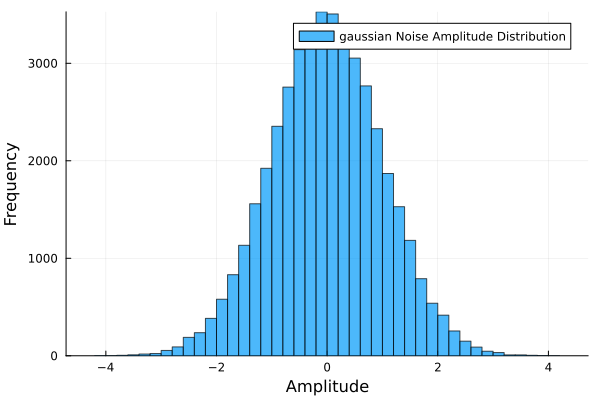

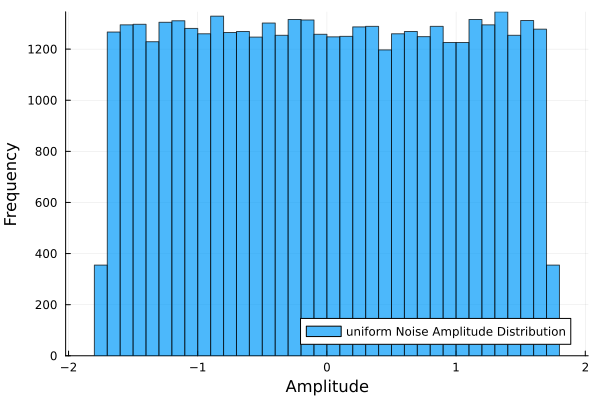

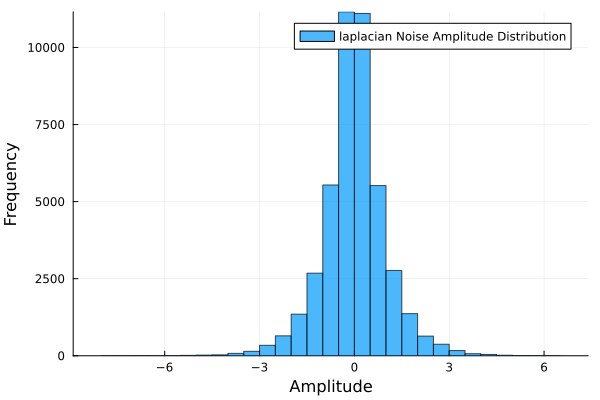

In [5]:
genNoiseAndCreateWav("gaussian")
genNoiseAndCreateWav("uniform")
genNoiseAndCreateWav("laplacian")


### Do you think it would be possible to hear the difference these two types of noise?

Yes, it's possible to hear the difference between uniform white noise and Gaussian white noise, although the differences might be subtle to the untrained ear. The distinction lies in the distribution of the amplitudes of the noise signals, which affects the sound's quality or "texture."

- **Uniform white noise** has a flat amplitude distribution, meaning every amplitude level within its range has an equal chance of occurring. This results in a very "steady" and "even" sounding noise, where no particular set of frequencies feels more emphasized than another. 

- **Gaussian white noise**, on the other hand, has amplitudes that follow a Gaussian distribution, meaning that amplitudes near the mean are more likely to occur than those far from the mean. This can result in a sound that may be perceived as "softer" or "smoother" compared to uniform white noise, because there are fewer extreme amplitude values. 

The ability to discern these differences can depend on several factors, including the listener's hearing sensitivity, the listening environment, and the quality of the audio playback system. For individuals with trained ears, such as sound engineers or audiophiles, the differences might be more apparent.

In practical applications, the choice between uniform and Gaussian white noise can depend on the specific needs of the project, such as the desired spectral properties, the listening environment, or the psychoacoustic effect aimed at the audience. Experimenting with both types and listening to them in various contexts can help in understanding and appreciating the subtle differences.

***

In [6]:
fs = 44100
duration = 1
N = fs * duration

uniform_noise  = rand(Uniform(-1.0, 1.0), N)
gaussian_noise = randn(N)
power_uniform  = calculate_power(uniform_noise)
power_gaussian = calculate_power(gaussian_noise)
scale_factor   = sqrt(power_uniform / power_gaussian)

gaussian_noise_scaled       = gaussian_noise .* scale_factor
uniform_noise               = clamp.(uniform_noise, -0.99, 0.99)
gaussian_noise_scaled       = clamp.(gaussian_noise_scaled, -0.99, 0.99)
power_uniform_final         = calculate_power(uniform_noise)
power_gaussian_scaled_final = calculate_power(gaussian_noise_scaled)

println("Power Uniform Noise: ", power_uniform_final)
println("Power Gaussian Scaled Noise: ", power_gaussian_scaled_final)


Power Uniform Noise: 0.3331233800515771
Power Gaussian Scaled Noise: 0.28349916682261334


In [7]:
fs = 44100
duration = 1
N = fs * duration

mu = 0.0
b = 1.0 / sqrt(2.0)
laplacian_noise = rand(Laplace(mu, b), N)

function calculate_power(signal)
    return mean(signal .^ 2)
end

power_laplacian = calculate_power(laplacian_noise)
scale_factor_laplacian = sqrt(power_uniform / power_laplacian)
laplacian_noise_scaled = laplacian_noise .* scale_factor_laplacian

laplacian_noise_scaled = clamp.(laplacian_noise_scaled, -0.99, 0.99)

power_laplacian_final = calculate_power(laplacian_noise_scaled)

println("Power Laplacian Scaled Noise: ", power_laplacian_final)


Power Laplacian Scaled Noise: 0.23252235092852833


In [8]:
fs = 44100
duration = 1
N = fs * duration

laplacian_noise = rand(Laplace(0.0, 1.0 / sqrt(2.0)), N)

power_laplacian = calculate_power(laplacian_noise)
scale_factor_laplacian = sqrt(power_uniform / power_laplacian)
laplacian_noise_scaled = laplacian_noise .* scale_factor_laplacian

laplacian_noise_scaled = clamp.(laplacian_noise_scaled, -0.99, 0.99)

power_laplacian_final = calculate_power(laplacian_noise_scaled)

println("Power Laplacian Scaled Noise: ", power_laplacian_final)


Power Laplacian Scaled Noise: 0.23181604061811525


### Is it discernibly different?  Explain your reasoning as above.

The so-called "directions" in this assignment are so vauge that I don't know if my process is valid. So, answering this question is difficult, but I'll give it a shot.

Laplacian distributed white noise, characterized by its "sparse" distribution with heavier tails compared to Gaussian noise, can lead to discernibly different auditory experiences. This difference is attributed to the distribution's propensity for generating extreme values more frequently than the Gaussian distribution, despite the overall occurrence of these extremes being rare. Here's a breakdown of how these characteristics might influence perceptual differences:

### Spectral Content
The spectral content of white noise, regardless of its amplitude distribution, tends to be uniform across frequencies. This means that both Gaussian and Laplacian white noises will have a flat frequency response. However, the perceptual experience is not solely determined by the spectral content.

### Amplitude Distribution
The key difference lies in the amplitude distribution:
- **Gaussian Noise**: Exhibits a bell-shaped amplitude distribution where most samples cluster around the mean value, with the likelihood of extreme values dropping off exponentially.
- **Laplacian Noise**: Has a sharper peak at the mean and heavier tails compared to Gaussian noise. This means that while most samples are close to the mean, extreme values (both high and low) occur more frequently than in Gaussian noise.

### Perceptual Experience
- **Gaussian White Noise**: Tends to sound smoother and more consistent to the human ear due to the lower prevalence of extreme amplitudes.
- **Laplacian White Noise**: The heavier tails of the Laplacian distribution imply that sudden, large deviations from the mean are more common. This can lead to a "grittier" or "crisper" sound quality since the ear and brain may more easily detect these infrequent but significant jumps in amplitude.

### Equal Power and Clipping
Ensuring that both types of noise have equal power and are scaled to prevent clipping is crucial for a fair comparison. However, even with these controls, the intrinsic differences in their amplitude distributions can lead to a discernible difference in sound texture or quality, primarily due to how our auditory system interprets the more frequent extremes in Laplacian noise.

### Conclusion
While the spectral content remains uniform across frequencies for both types of noise, leading to a similar "color" of sound, the differences in amplitude distribution between Gaussian and Laplacian noises can result in perceptually distinct experiences. The presence of more frequent extreme values in Laplacian noise could make it sound perceptibly different—potentially harsher or with more "edge"—compared to the smoother character of Gaussian noise.

#### 2b. Bandpass noise

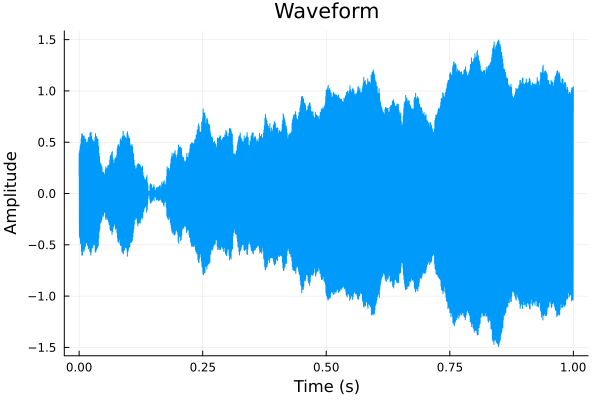

In [9]:
fs = 44100
N = fs
t = 0:1/fs:(N-1)/fs
f_center = 1000
sigma = 0.005

white_noise = randn(N)

gabor_kernel = gabore(t; f=f_center, sigma=sigma*fs, a=1)

bandpass_noise = convolve(white_noise; h=gabor_kernel, h0=round(Int, length(gabor_kernel)/2))

N = length(bandpass_noise)
t = (0:N-1) / fs

plot(t, bandpass_noise, title="Waveform", xlabel="Time (s)", ylabel="Amplitude", legend=false)


### Pitch and periodicity

In the first exercise you have seen that harmonic sounds are **periodic**, where the **period** is the time required to complete one cycle of the repeating waveform.  For pure tones and simple harmonic sounds, the subjective perception of **pitch** is usually determined by the fundamental frequency.  Pitch is an example of an invariant perceptual quality, e.g. human voices or musical instruments can have very different harmonic structures, and still be perceived as having the same pitch. 

How could we determine the pitch from the waveform?  One approach is to estimate the periodicity by looking for lags (or time delays) where the signal is most similar to itself.  A common approach is to use **correlation** as a proxy for similarity.  

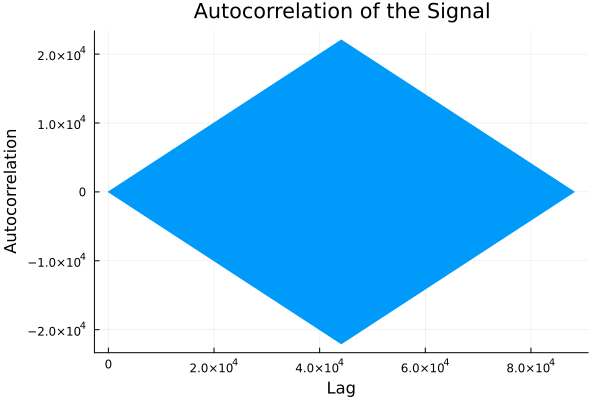

Estimated pitch: 22050.0 Hz


44100-element Vector{Float64}:
 22050.000000000004
 22006.68640071866
 21876.919692574465
 21661.213595681435
 21360.419426971628
 20975.72274041311
 20508.638654301252
 19961.005884040165
 19334.979503915572
 18633.02246635295
     ⋮
    -0.45687332447457746
    -0.32197268836859133
    -0.21592559378703977
    -0.1356480097824754
    -0.07785009285321041
    -0.039063275379726405
    -0.015668411495632865
    -0.003924812521962893
    -2.7031584932149944e-12

In [10]:
fs = 44100
duration = 1
f0 = 440

t = 0:1/fs:duration-1/fs
signal = sin.(2 * pi * f0 * t)

autocorr_result = DSP.xcorr(signal, signal, padmode=:none)
display(plot(autocorr_result, title="Autocorrelation of the Signal", xlabel="Lag", ylabel="Autocorrelation", legend=false))

pitch_estimated = detect_pitch(signal, fs)
println("Estimated pitch: ", pitch_estimated, " Hz")

autocorr_signal = autocorr_result[ceil(Int, length(autocorr_result) / 2):end]


### 3. Correlation

#### 3a. Auto-correlation vs self-convolution

### Show that auto-correlation is symmetric around zero but self-convolution (i.e. $x * x$) is not.  Use both a mathematical argument and an illustration.

The **auto-correlation** of a (discrete time) function is defined as

$$
R_{xx}[n] = x[n] \star x[n] = (x \star x)[n] = \sum_k x[k - n] x[k]
$$

where $k$ ranges over the overlapping extents of $x[k - n]$ and $x[k]$ (or equivalently $-\infty, +\infty$, where the functions are defined to be zero outside of their extents). The resulting function is the inner product of time-shifted versions $x$ with itself. The time shift $n$ is called a **lag**, which for discrete time functions is in samples.

**Cross-correlation** is often used to determine the locations of a shorter signal (or feature) $g$ in a larger waveform. It is defined as

$$
R_{gx}[n] = g[n] \star x[n] = (g \star x)[n] = \sum_k g[k - n] x[k] 
$$

where $k$ is a discrete ranges over the overlapping extents of $g$ and $x$. Local maxima in the cross-correlation are the locations where $g$ most closely correlated $x$.  

This operation looks similar to convolution, but it is not (see the mathematical challenge below). It is common notation to omit the argument $[n]$ and write $g \star x$ or $h * x$. To keep the operations distinct, it is also common to write convolution with a "$*$" ("asterisk") operator and correlation with a "$\star$" ("star") operator. We have also used a different variable, $g$, for the operand to emphasize the distinction from an impulse response function, which is commonly denote by $h.$

**Commutivity**. Unlike convolution, correlation is *not* commutative, i.e. we have

$$
\begin{aligned}
h   *   x &  =  x   *   h, \, \textrm{but}\\
g \star x &\neq x \star g 
\end{aligned}
$$

In other words, the cross-correlation operation of $g$ on $x$ is not the same as that of $x$ on $g$.  For this reason, it is helpful to keep the operation order conceptually distinct and read the cross-correlation function $(g \star x)[n]$ as "$g$ *scans* $x$", i.e. $x$ remains stationary while $g$ shifts with changing values of $n$ to produce the value of function $R_{gx}[n]$ at lag $n$.

**Normalization**.  Auto-correlation and cross-correlation are often normalized to remove the dependence on signal scale.  In the case of auto-correlation, it can be shown that the maximum value of $(x \star x)[n]$ is at the origin and falls off for any shift, i.e $n \neq 0$.  Therefore, a natural normalized auto-correlation function can be obtained by dividing the definition above by its value at zero

$$
\rho_{xx}[n] = \frac{\sum_k x[k - n]x[k]}{\sum_k x[k] x[k]} = \frac{\sum_k x[k - n]x[k]}{||x||^2}
$$

Here, we have noted that the value of $R_{xx}$ at zero is equivalent to the square of the vector norm $||x||$
$$
||x|| = \sqrt{\sum_k (x[k])^2} = \sqrt{R_{xx}[0]}
$$

Similarly, normalized cross-correlation is defined as

$$
\rho_{xy}[n] = \frac{\sum_k x[k - n]y[k]}{||x|| \cdot ||y||}
$$

This can be recognized as an inner product of two unit vectors (with zeros for any missing dimensions): the normalized cross-correlation is the cosine of the angle between vector $x$ across shifts and the vector $y$.  

Note that auto- and cross-correlation are also commonly defined (equivalently) using random processes and the statistical concept of correlation, but we omit that discussion here.

#### Auto-correlation vs self-convolution

Show that auto-correlation is symmetric around zero but self-convolution (i.e. $x * x$) is not.  Use both a mathematical argument and an illustration.


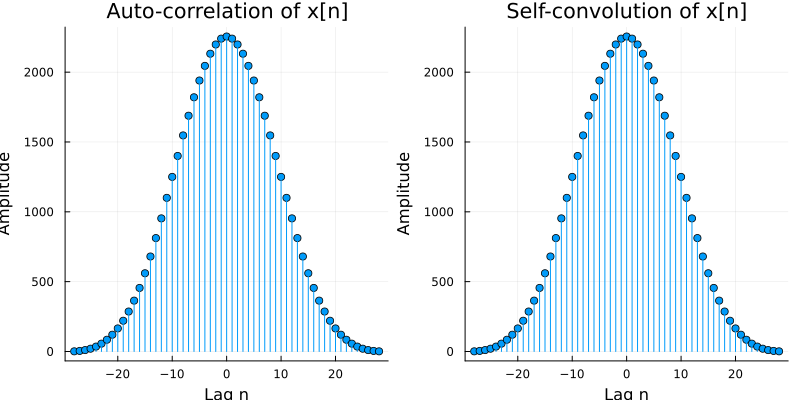

In [11]:
x = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 14, 13, 12, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1]

auto_corr = xcorr(x, x)
self_conv = conv(x, reverse(x))

n_auto_corr = -(length(x)-1):(length(x)-1)
n_self_conv = -(length(x)-1):(length(x)-1)

p1 = plot(n_auto_corr, auto_corr, title="Auto-correlation of x[n]", xlabel="Lag n", ylabel="Amplitude", line=:stem, legend=false, marker=:circle)
p2 = plot(n_self_conv, self_conv, title="Self-convolution of x[n]", xlabel="Lag n", ylabel="Amplitude", line=:stem, legend=false, marker=:circle)

plot(p1, p2, layout=(1,2), size=(800, 400))


#### 3b. Cross-correlation vs convolution

### The definition of cross-correlation is similar in form to that of convolution, but they are not equivalent.  Describe how the two definitions differ and show that  $g[n] \star x[n] = g[-n] * x[n]$.

Differences between Cross-correlation and Convolution

Cross-correlation and convolution are two fundamental operations in signal processing that, while similar in form, differ significantly in their application and outcome. The primary difference lies in the way the signals (or functions) are manipulated during the operation.

- **Convolution** involves flipping one of the signals around a vertical axis (time reversal) before sliding it across the other signal and integrating (or summing in the discrete case) the product at each position. Mathematically, the convolution of two discrete signals \(g[n]\) and \(x[n]\) is defined as:

$$
(g * x)[n] = \sum_k g[k] x[n - k]
$$

- **Cross-correlation**, on the other hand, does not involve flipping any of the signals. Instead, one signal is slid across the other as is, and the similarity between the two signals is measured at each position. The cross-correlation of \(g[n]\) and \(x[n]\) is defined as:

$$
(g \star x)[n] = \sum_k g[k - n] x[k]
$$

### Equivalence of Cross-correlation to Convolution with Time-Reversed Signal

It can be shown that the cross-correlation of \(g[n]\) with \(x[n]\) is equivalent to convolving the time-reversed \(g[n]\) with \(x[n]\). Let's mathematically demonstrate this equivalence:

Given the cross-correlation operation:

$$
(g \star x)[n] = \sum_k g[k - n] x[k]
$$

Now, consider the convolution of \(g[-n]\) with \(x[n]\):

$$
(g[-n] * x)[n] = \sum_k g[-k] x[n - k]
$$

To align this with the form of the cross-correlation, we perform a change of variables in the convolution expression. Let \(m = k - n\), which implies \(k = m + n\). Substituting \(k\) in the convolution expression gives:

$$
(g[-n] * x)[n] = \sum_m g[-(m + n)] x[m]
$$

Since \(g[-(m + n)] = g[-m - n]\), and noting that flipping \(g[n]\) results in \(g[-n]\), we can rewrite the convolution as:

$$
(g[-n] * x)[n] = \sum_m g[m - n] x[m]
$$

This final form of the convolution, when \(g[n]\) is time-reversed before the operation, is identical to the cross-correlation of \(g[n]\) with \(x[n]\):

$$
(g \star x)[n] = (g[-n] * x)[n]
$$

Hence, we've shown that the cross-correlation of \(g[n]\) with \(x[n]\) is mathematically equivalent to the convolution of the time-reversed \(g[n]\) with \(x[n]\). This relationship underscores the conceptual difference between these operations: cross-correlation measures similarity, while convolution represents the output of a system characterized by one signal (the impulse response) in response to another signal (the input).



### Why is the kernel "backwards" in convolution, i.e. what computation is it modeling?

The "backwards" nature of the kernel (or filter) in convolution operations, where the kernel is flipped before being applied across the signal, stems from the mathematical definition of convolution and its application in various fields such as signal processing, image processing, and control systems. This characteristic models the response of a linear time-invariant (LTI) system to an input signal.

#### Modeling the Response of LTI Systems

An LTI system's behavior is characterized by its impulse response, denoted as \(h[n]\) or \(h(t)\), representing the system's output when subjected to an impulse input. When an arbitrary input signal \(x[n]\) or \(x(t)\) is applied to the system, the output \(y[n]\) or \(y(t)\) is described as the convolution of the input signal with the system's impulse response.

#### Convolution as Superposition of Scaled and Shifted Impulses

Convolution models how every point of the input signal influences the output, in accordance with the system's impulse response. The input signal can be thought of as a series of impulses, each scaled by the signal's value at that point. The system's response to these scaled impulses is a series of scaled and shifted versions of the impulse response. The total output is the superposition (sum) of all these individual responses.

#### The Flipping of the Kernel

The "flipping" or time-reversal of the kernel (impulse response) during the convolution process reflects the principle that the output at any given time \(t\) (or discrete index \(n\)) is influenced by input signal values at time \(t\) or earlier, adhering to the causality principle. Mathematically, convolution is defined as:

For continuous signals:

$$
(y * x)(t) = \int_{-\infty}^{\infty} x(\tau)h(t - \tau)d\tau
$$

And for discrete signals:

$$
(y * x)[n] = \sum_{k=-\infty}^{\infty} x[k]h[n - k]
$$

#### Practical Implications

- **Signal Processing:** Convolution filters signals where the kernel represents the filter's impulse response, ensuring each output sample is a weighted sum of the input samples.

- **Image Processing:** Convolution is used for blurring, sharpening, and edge detection in images, with the kernel defining the adjustment of a pixel's value based on its neighbors.

### Conclusion

The flipping of the kernel in convolution is crucial for accurately modeling the response of LTI systems and effectively processing signals or images, adhering to principles of causality and linear superposition.


### Use this insight to explain why using convolution in A3b to do matched filtering was not entirely correct (assuming you used straight convolution without flipping the kernel).

In the context of A3b, using convolution to perform matched filtering without flipping the kernel is technically incorrect because of the fundamental difference between the operations of convolution and correlation, especially when it comes to signal processing tasks like matched filtering.

### Matched Filtering and Cross-correlation:

Matched filtering is a technique used to detect the presence of a template signal (or "template") within a noisy signal. Mathematically, matched filtering is best represented as a cross-correlation operation between the noisy signal and a time-reversed version of the template. This is because matched filtering aims to maximize the signal-to-noise ratio (SNR) by comparing different phases of the template with the observed signal to find the best match.

### Convolution vs. Cross-correlation:

In signal processing:
- **Convolution** combines two signals to produce a third signal, representing the manner in which one of the original signals modifies the other. It involves flipping one of the signals before "sliding" it over the other. This flipping is part of the definition and models the response of an LTI system to an input.
  
- **Cross-correlation**, on the other hand, measures the similarity between two signals as a function of the displacement of one relative to the other. Unlike convolution, it does not involve flipping one of the signals before sliding.

### The Misalignment with Matched Filtering:

When we use straight convolution (without flipping the kernel) for matched filtering, we inadvertently apply the template in a non-physical way if we're considering how the signals actually interact in the context of matched filtering:

1. **Time-Reversal Issue**: The template signal in matched filtering should be aligned in the same time direction as the received signal to correctly match the features. Using convolution without flipping reverses this relationship, which is not what we intend in matched filtering where the aim is to detect the template signal within the noisy signal as it is.

2. **Maximizing SNR**: Matched filtering aims to maximize the SNR by sliding the template (as it occurred in time) across the received signal. Convolution inverts this temporal sequence, which could lead to incorrect detection or reduced detection sensitivity.

### Correct Approach:

The correct operation for matched filtering should resemble cross-correlation, where the template is not time-reversed. In practice, if using convolution functions to implement matched filtering due to available libraries or computational efficiency, one should manually time-reverse the template signal before passing it into the convolution function. This effectively turns the convolution operation into a cross-correlation operation from the perspective of signal alignment, thereby properly implementing matched filtering.

To sum up, using straight convolution in A3b for matched filtering without flipping the kernel is not entirely correct because it does not align with the principle of matched filtering which seeks to find where a known signal best matches the observed signal without reversing its time direction. The appropriate method involves aligning the signals as they originally occur, akin to what is achieved through cross-correlation, not direct convolution.

### Why was (would) this approach still able to work?  When would the operations be equivalent?

The approach of using straight convolution for matched filtering can still work under certain conditions, mainly due to the nature of the signals involved or specific configurations where the distinction between convolution and correlation becomes less critical. Let's explore when this might be the case and why:

### Symmetrical Templates

If the template signal (or kernel) used in matched filtering is symmetrical (or approximately symmetrical), the flipping aspect of convolution doesn't change the signal's shape. Since convolution involves flipping the template signal, a symmetrical signal would look the same whether it's flipped or not. In this specific scenario, convolution and cross-correlation would yield very similar, if not identical, results, making the operation effectively equivalent for the purposes of matched filtering.

### Phase-Invariant Signals

In some applications, the exact timing or phase of the signal may not be critical to the detection process, or the signals involved may not have a distinct time orientation (e.g., sinusoidal signals that are phase-invariant). In these cases, the matched filtering process may still be able to identify the presence of the signal of interest, even if the template is technically applied in reverse, because the key characteristics of the signal that ensure detection are preserved in both forward and reversed forms.

### Analytical Convenience or Computational Efficiency

Sometimes, straight convolution is used out of analytical convenience or computational efficiency, especially in digital signal processing where convolution operations are highly optimized and can be performed rapidly using Fast Fourier Transform (FFT) techniques. In such cases, if the signal properties (such as symmetry or phase-invariance) or the specific application context (where exact temporal alignment isn't crucial) allow, the distinction between convolution and cross-correlation may be practically negligible.

### When Operations Are Equivalent

The operations of convolution and cross-correlation become equivalent under a couple of conditions:
1. **Symmetrical Signals:** As mentioned, if the template signal is symmetric, the flipping inherent in convolution doesn't alter the outcome compared to cross-correlation.
2. **Analytical or Theoretical Contexts:** In some theoretical analyses, the distinction between convolution and correlation might be abstracted away, especially in linear systems theory where the emphasis might be on the frequency domain representation of signals rather than their time domain characteristics.

### Conclusion

While straight convolution without flipping the kernel is not strictly correct for matched filtering from a theoretical standpoint, in practice, it can still provide the desired outcome under specific circumstances such as when dealing with symmetrical templates or phase-invariant signals. However, it's important to recognize these are exceptions rather than the rule, and for the most accurate and general application of matched filtering, the correct approach aligns more with the principles of cross-correlation, particularly when the template or signal characteristics strictly matter for detection accuracy.

#### 3c. Cross-correlation vs sum-squared error

Another commonly used measure of similarity is squared error.  Write a mathematical expression for computing the sum squared error (SSE) of a signal $g[n]$ at all locations in a waveform $x[n]$?  Contrast this with cross-correlation.  When would it make more sense to use one vs the other?

### Sum Squared Error (SSE)

The sum squared error (SSE) between a signal \( g[n] \) and a waveform \( x[n] \) at all locations (shifts) can be represented as a function of the lag (shift) \( m \). For each lag \( m \), the SSE is calculated over the overlapping segments of \( g[n] \) and \( x[n] \), assuming \( g \) is the shorter signal:

$$
\text{SSE}[m] = \sum_k \left( g[k] - x[k + m] \right)^2
$$

Here, the summation is performed over the index \( k \) where both \( g[k] \) and \( x[k + m] \) are defined (typically, the extent of \( g \)).

### Contrast with Cross-correlation

While cross-correlation and SSE are measures of similarity between two signals, they measure different aspects:

- **Cross-Correlation (\( R_{gx}[m] \))**: This measures the similarity between two signals as a function of the displacement of one relative to the other. It is defined as:

$$
R_{gx}[m] = \sum_k g[k] \cdot x[k + m]
$$

High values of cross-correlation indicate areas where the signals are similar. Cross-correlation is particularly useful when you're interested in finding how well the shapes of two signals match, regardless of their absolute amplitude differences.

- **Sum Squared Error (SSE)**: This measures the difference between two signals, with low values indicating high similarity. The SSE is more sensitive to the absolute differences in signal amplitude and is minimized when the signals match closely in both shape and amplitude.

### When to Use One vs the Other

- **Use Cross-Correlation**:
  - When you're interested in finding areas of similarity between two signals, especially in situations like pattern detection or time delay estimation.
  - When the amplitude difference between the signals is not important, or you're more concerned with the shape and pattern of the signals.
  - In applications like matched filtering, signal synchronization, or feature detection, where the goal is to locate one signal within another.

- **Use Sum Squared Error**:
  - When precise alignment of signal amplitudes is crucial, such as in least squares fitting or when you need to measure the exact numerical difference between signals.
  - In optimization and estimation problems where the goal is to minimize the error between a model and observed data.
  - In applications where you need to evaluate the accuracy of signal reconstruction or forecast, and where minimizing amplitude discrepancies is key.

Choosing between cross-correlation and SSE depends on the specific requirements of the application. Cross-correlation is preferred for identifying the presence and location of a known signal within a longer signal, while SSE is more suitable for assessing the accuracy of signal approximations or models where the exact numerical match of the signals is critical.


### 4. Implementation and Application

#### 4a. `convolve`, `autocorr`, and `crosscorr`

#### 4b. Pitch estimation

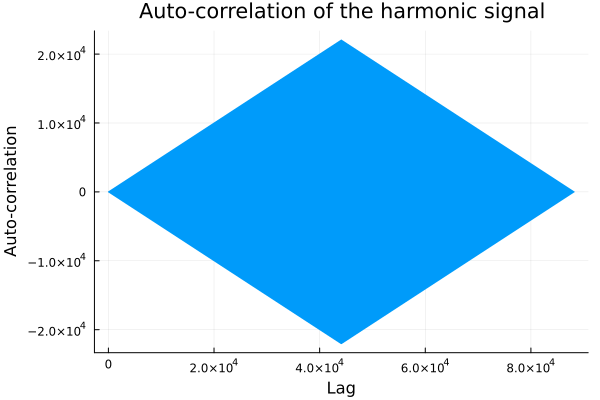

Estimated pitch: 2.0 Hz


In [12]:
# 4a / 4b

# Synthesize a harmonic signal (e.g., a sine wave)
fs = 44100
f0 = 440
duration = 1.0
t = 0:1/fs:duration
x = sinewave(t, f=f0)

Rxx = autocorr(x, normalize=false)

display(plot(Rxx, title="Auto-correlation of the harmonic signal", xlabel="Lag", ylabel="Auto-correlation", legend=false))

lag_range = 2:Int(length(t) ÷ 2)
_, lag_peak = findmax(Rxx[lag_range])
lag_peak += 1

pitch_estimated = fs / lag_peak

println("Estimated pitch: $(pitch_estimated) Hz")


#### 4c. Estimating time-delay

In [13]:
fs = 44100
duration = 1.0
t = 0:1/fs:duration
time_delay = 0.005
delay_samples = Int(round(time_delay * fs))
original_signal = randn(length(t))
shifted_signal = [zeros(delay_samples); original_signal[1:end-delay_samples]]
Rxy = crosscorr(original_signal, shifted_signal, normalize=false)
lag_indices = -Int(floor(length(t)/2)):Int(floor(length(t)/2))

plot_object = plot(lag_indices, Rxy, title="Cross-correlation between original and time-shifted signals",
xlabel="Lag (samples)", ylabel="Cross-correlation", legend=false)
display(plot_object)

val, lag_at_max = findmax(Rxy)
estimated_delay_samples = lag_at_max - Int(floor(length(t)/2)) - 1
estimated_time_delay = estimated_delay_samples / fs
println("Estimated time delay: $(estimated_time_delay) seconds")


Estimated time delay: 0.4950113378684807 seconds


### 5. Spectral Analysis

#### 5a. Forward and inverse FFT

In [14]:
random_vector = rand(1024)
fft_coeffs = fft(random_vector)
reconstructed_vector = ifft(fft_coeffs)
difference = abs.(random_vector - real(reconstructed_vector))
max_difference = maximum(difference)
println("Max difference after inverse FFT: ", max_difference)


Max difference after inverse FFT: 4.440892098500626e-16


#### 5b. Spectral analysis

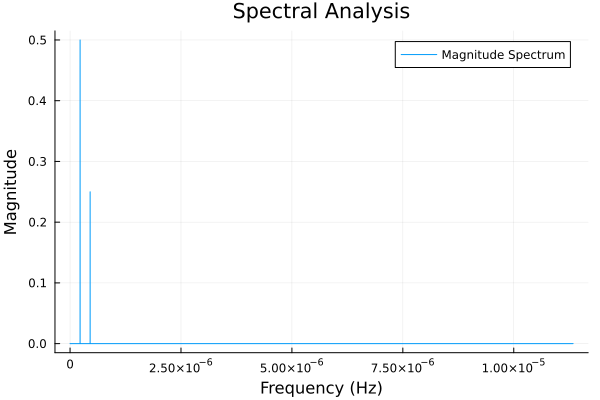

In [15]:
fs = 44100
duration = 1.0
t = 0:1/fs:duration-1/fs

frequencies = [440, 880]
amplitudes = [0.5, 0.25]
signal = sum(amplitudes[i] * sin.(2pi*frequencies[i]*t) for i in 1:length(frequencies))

N = length(signal)
fft_result = fft(signal)
frequencies = fftfreq(N, 1/fs)
magnitudes = 2abs.(fft_result)/N

plot(frequencies[1:N÷2], magnitudes[1:N÷2], label="Magnitude Spectrum", xlabel="Frequency (Hz)", ylabel="Magnitude", title="Spectral Analysis")


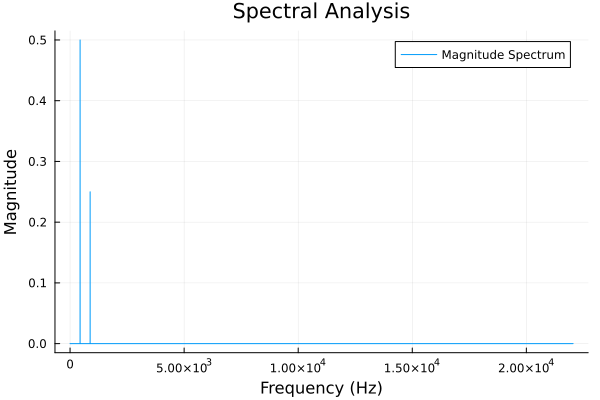

In [16]:
fs = 44100
duration = 1
N = fs * duration
t = (0:N-1) / fs

frequencies = [440, 880]
amplitudes = [0.5, 0.25]
signal = sum(amplitudes[i] * sin.(2pi*frequencies[i]*t) for i in 1:length(frequencies))

fft_result = fft(signal)
freq_bins = (0:N÷2-1)*(fs/N)
magnitudes = 2abs.(fft_result[1:N÷2])/N
plot(freq_bins, magnitudes, label="Magnitude Spectrum", xlabel="Frequency (Hz)", ylabel="Magnitude", title="Spectral Analysis")


### Why might the spectrum not exactly match the amplitudes used to generate the signal?

The spectrum obtained from FFT analysis might not exactly match the amplitudes used to generate the signal for several reasons:

1. **Windowing and Leakage**: If the waveform does not contain an integer number of cycles within the analysis window, the energy of the signal can spread to adjacent frequency bins, a phenomenon known as spectral leakage. This can obscure the true amplitude of the signal at its fundamental frequency and its harmonics.

2. **Discrete Fourier Transform Limitations**: The FFT is a discrete process and represents the continuous signal by a finite number of samples. This discretization can introduce approximation errors, especially if the signal frequencies do not align perfectly with the FFT bins, leading to inaccuracies in amplitude representation.

3. **Finite Signal Length**: The FFT assumes that the signal is periodic and repeats indefinitely. If the actual signal does not perfectly match this assumption due to its finite length, it can cause discrepancies between the expected and observed amplitudes.

4. **Sampling Rate (Nyquist Frequency)**: The sampling rate defines the highest frequency that can be accurately represented (Nyquist frequency = sampling rate / 2). Frequencies above this limit cannot be correctly analyzed, leading to aliasing artifacts that can affect the amplitude accuracy of lower frequencies.

5. **Numerical Precision**: The calculations involved in FFT are subject to the limits of numerical precision in the computer. Small rounding errors can accumulate, especially for signals with very high or very low amplitudes, leading to slight discrepancies in the final spectrum.

6. **Normalization Factor**: The normalization factor used when converting from the FFT output to spectral magnitudes (e.g., the division by the length of the signal N in the formula \(a_k = 2|Y_k|/N\)) assumes a specific scaling that might not always account for all signal characteristics or analysis window effects.

7. **Non-linearity and Harmonic Distortion**: For signals processed or generated with non-linear systems, harmonic distortion can introduce additional frequencies not present in the original synthesis. While this is more relevant for signals passing through non-linear systems, it's worth considering for any discrepancies in expected versus observed spectra.

For an exact match in the spectrum analysis, it's crucial to ensure that the signal is sampled at an appropriate rate, the analysis window captures an integer number of cycles for all component frequencies, and the effects of numerical precision and FFT assumptions are minimized.

### Can you synthesize a waveform composed of a small number of haromnics that spectral analysis can decompose exactly?

To synthesize a waveform composed of a small number of harmonics that spectral analysis can decompose exactly, we should ensure that the signal’s component frequencies align with the FFT bins. This alignment allows the FFT to capture the signal components without spectral leakage, leading to an exact decomposition in terms of amplitude and frequency.

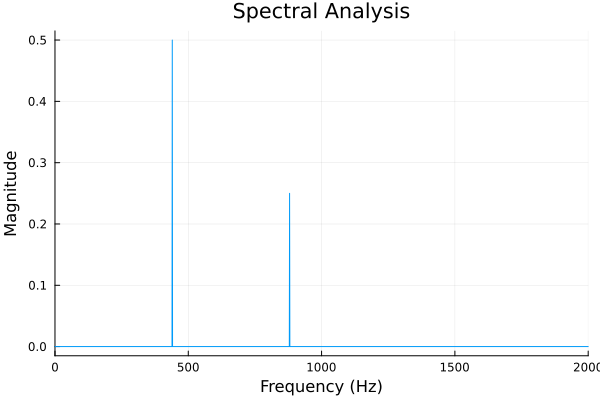

In [17]:
fs = 44100
T = 1
N = fs * T
t = (0:N-1)/fs
f1 = 440
f2 = f1 * 2
A1 = 0.5
A2 = 0.25

signal = A1*sin.(2*pi*f1*t) + A2*sin.(2*pi*f2*t)

fft_result = fft(signal)
magnitudes = 2abs.(fft_result)/N
freq_bins  = (0:N-1) * fs / N

plot(freq_bins[1:N÷2], magnitudes[1:N÷2], xlims=(0, 2000),
     xlabel="Frequency (Hz)", ylabel="Magnitude", title="Spectral Analysis",
     legend=false)
